In [ ]:
import pandas as pd
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import AdaBoostClassifier
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import classification_report, accuracy_score, recall_score, f1_score, precision_score
import numpy as np
from sklearn.datasets import make_classification
from imblearn.over_sampling import SMOTE
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error
from scipy.stats import wasserstein_distance
from sklearn.preprocessing import StandardScaler
from sklearn.utils import resample
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.utils.class_weight import compute_sample_weight
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score

# Distribution Figure

<ipython-input-99-0ce2e644c473>:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  experiment_data = pd.read_csv('/content/drive/MyDrive/MethodsOutput/EXP_output.csv')


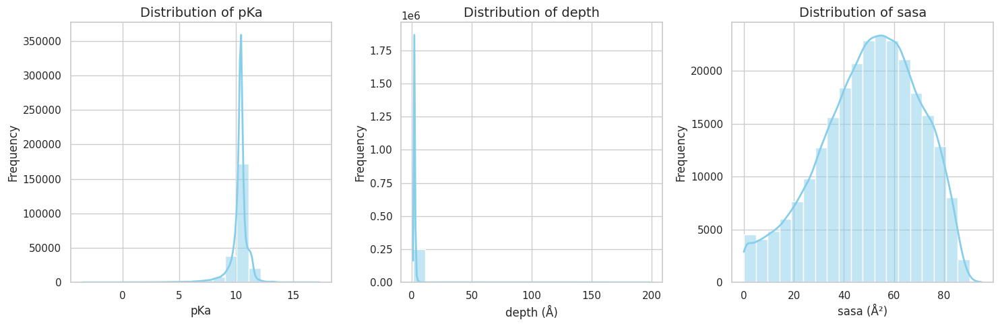

In [ ]:
experiment_data = pd.read_csv('/content/drive/MyDrive/MethodsOutput/EXP_output.csv')

# Select three features
features = ['pKa', 'depth', 'sasa']
units = ['', ' (Å)', ' (Å²)']

sns.set(style="whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=False, sharey=False)
for i, feature in enumerate(features):
    sns.histplot(
        data=experiment_data,
        x=feature,
        kde=True,
        bins=20,
        ax=axes[i],
        color='skyblue',
        line_kws={'linewidth': 2, 'color': 'red'}
    )
    axes[i].set_title(f'Distribution of {feature}', fontsize=14)
    axes[i].set_xlabel(f'{feature}{units[i]}', fontsize=12)
    axes[i].set_ylabel('Frequency', fontsize=12)
plt.tight_layout()
plt.show()

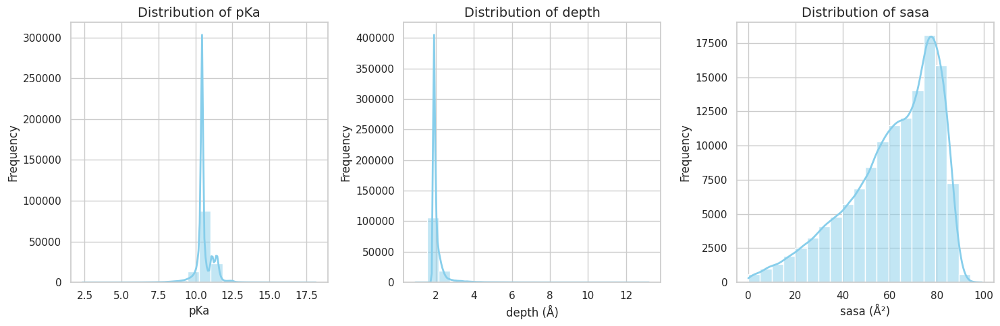

In [ ]:
experiment_data = pd.read_csv('/content/drive/MyDrive/MethodsOutput/Predicted_output.csv')
features = ['pKa', 'depth', 'sasa']
units = ['', ' (Å)', ' (Å²)']
sns.set(style="whitegrid")
fig, axes = plt.subplots(1, 3, figsize=(15, 5), sharex=False, sharey=False)
for i, feature in enumerate(features):
    sns.histplot(
        data=experiment_data,
        x=feature,
        kde=True,
        bins=20,
        ax=axes[i],
        color='skyblue',
        line_kws={'linewidth': 2, 'color': 'red'}
    )
    axes[i].set_title(f'Distribution of {feature}', fontsize=14)
    axes[i].set_xlabel(f'{feature}{units[i]}', fontsize=12)
    axes[i].set_ylabel('Frequency', fontsize=12)
plt.tight_layout()
plt.show()

# LABEL 1  and LABEL 0

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/MethodsOutput/EXP_output.csv')
df2 = pd.read_csv('/content/drive/MyDrive/MethodsOutput/Predicted_output.csv')

<ipython-input-101-b5db09950d77>:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/drive/MyDrive/MethodsOutput/EXP_output.csv')


In [ ]:
# Load glycation.csv
glycation_df = pd.read_csv('/content/glycation.csv')

# Merge the two dataframes based on 'Uniprot_Entry' and 'Resid'
df = pd.merge(df, glycation_df[['Uniprot_Entry', 'Resid']],
                     on=['Uniprot_Entry', 'Resid'], how='left', indicator=True)

# Add the 'label' column
df['label'] = df['_merge'].apply(lambda x: '1' if x == 'both' else '0')

# Drop the '_merge' column, as it's no longer needed
df = df.drop(columns=['_merge'])

# Remove rows with missing values ​​in columns 'pKa', 'depth', 'sasa'
df = df.dropna(subset=['pKa', 'depth', 'sasa'])

# Remove rows where 'pKa' is less than 0 and 'depth' is greater than 50
df = df[(df['pKa'] >= 0) & (df['depth'] <= 50)]

# Save the result as a new CSV file
df.to_csv('/content/drive/MyDrive/MethodsOutput/merged_result.csv', index=False)


In [ ]:
df2 = pd.merge(df2, glycation_df[['Uniprot_Entry', 'Resid']],
                     on=['Uniprot_Entry', 'Resid'], how='left', indicator=True)
df2['label'] = df2['_merge'].apply(lambda x: '1' if x == 'both' else '0')
df2 = df2.drop(columns=['_merge'])
df2 = df2.dropna(subset=['pKa', 'depth', 'sasa'])
df2 = df2[(df2['pKa'] >= 0) & (df2['depth'] <= 50)]
df2.to_csv('/content/drive/MyDrive/MethodsOutput/merged_pred_result.csv', index=False)


# EXP DATASET

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/MethodsOutput/merged_result.csv')

df_data = df.groupby(['Uniprot_Entry', 'Resid', 'label'], as_index=False).agg({
    'depth': 'mean',
    'pKa': 'mean',
    'sasa': 'mean'
})
df_data.to_csv('/content/drive/MyDrive/gather_out/ex_data.csv', index=False)

label_counts = df_data['label'].value_counts()

print("Label counts:\n", label_counts)

Label counts:
 label
0    10345
1      306
Name: count, dtype: int64


<ipython-input-42-3af9abb9bc57>:1: DtypeWarning: Columns (3) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/content/drive/MyDrive/MethodsOutput/merged_result.csv')


In [ ]:
import pandas as pd

df_data = pd.read_csv('/content/drive/MyDrive/gather_out/ex_data.csv')
df_ahm = pd.read_csv('/content/drive/MyDrive/gather_out/non_glycation_data.csv')

ahm_index = df_ahm.set_index(['Uniprot_Entry', 'Resid']).index

label0_data_ahm = df_data[
    (df_data['label'] == 0) &
    (df_data.set_index(['Uniprot_Entry', 'Resid']).index.isin(ahm_index))
]

# If the number of label=0 in the AHM data is less than 306, the AHM data will be used first and the remaining label=0 will be randomly filled.
if len(label0_data_ahm) < 400:
    remaining_needed = 400 - len(label0_data_ahm)
    label0_data_remaining = df_data[
        (df_data['label'] == 0) &
        (~df_data.set_index(['Uniprot_Entry', 'Resid']).index.isin(ahm_index))
    ].sample(n=remaining_needed, random_state=42)
    label0_data = pd.concat([label0_data_ahm, label0_data_remaining], axis=0, ignore_index=True)
else:
    label0_data = label0_data_ahm.sample(n=400, random_state=42)

label1_data = df_data[df_data['label'] == 1]

exp_data = pd.concat([label0_data, label1_data], axis=0, ignore_index=True)

exp_data.to_csv('/content/drive/MyDrive/gather_out/exp_dataset.csv', index=False)

# Reliability analysis of the AlphaFold model

In [ ]:
import pandas as pd

exp_data = pd.read_csv("/content/drive/MyDrive/gather_out/ex_data.csv")
pre_data = pd.read_csv("/content/drive/MyDrive/gather_out/pre_data.csv")

merged_data = pd.merge(exp_data, pre_data, on=['Uniprot_Entry', 'Resid'], suffixes=('_exp', '_pred'))

features = ['pKa', 'depth', 'sasa']

# Calculate the overall deviation (Mean Bias Error, MBE)
bias = {}
for feature in features:
    bias[feature] = (merged_data[f"{feature}_pred"] - merged_data[f"{feature}_exp"]).mean()

for feature, value in bias.items():
    print(f"Mean Bias Error for {feature}: {value:.4f}")

Mean Bias Error for pKa: 0.3449
Mean Bias Error for depth: -0.2951
Mean Bias Error for sasa: 3.9338


In [ ]:
exp_data = pd.read_csv("/content/drive/MyDrive/gather_out/ex_data.csv")
pre_data = pd.read_csv("/content/drive/MyDrive/gather_out/pre_data.csv")

merged_data = pd.merge(exp_data, pre_data, on=['Uniprot_Entry', 'Resid'], suffixes=('_exp', '_pred'))

features = ['pKa', 'depth', 'sasa']

# Calculate the MSE for each feature
mse_results = {}
for feature in features:
    mse = mean_squared_error(merged_data[f'{feature}_exp'], merged_data[f'{feature}_pred'])
    mse_results[feature] = mse

print("MSE Results for Each Feature:")
for feature, mse in mse_results.items():
    print(f"{feature}: {mse}")

MSE Results for Each Feature:
pKa: 0.5688260175629919
depth: 3.4364803176553322
sasa: 220.6568412141469


In [ ]:
from sklearn.metrics import mean_absolute_error

# Calculate the mean absolute error point by point
mae_pKa = mean_absolute_error(merged_data['pKa_exp'], merged_data['pKa_pred'])
mae_depth = mean_absolute_error(merged_data['depth_exp'], merged_data['depth_pred'])
mae_sasa = mean_absolute_error(merged_data['sasa_exp'], merged_data['sasa_pred'])

print(f"MAE for pKa: {mae_pKa:.4f}")
print(f"MAE for Depth: {mae_depth:.4f}")
print(f"MAE for SASA: {mae_sasa:.4f}")

MAE for pKa: 0.4985
MAE for Depth: 0.4036
MAE for SASA: 10.9454


In [ ]:
# Calculate Wasserstein distance
wd_pKa = wasserstein_distance(merged_data['pKa_exp'], merged_data['pKa_pred'])
wd_depth = wasserstein_distance(merged_data['depth_exp'], merged_data['depth_pred'])
wd_sasa = wasserstein_distance(merged_data['sasa_exp'], merged_data['sasa_pred'])

print(f"Wasserstein Distance for pKa: {wd_pKa:.4f}")
print(f"Wasserstein Distance for Depth: {wd_depth:.4f}")
print(f"Wasserstein Distance for SASA: {wd_sasa:.4f}")

Wasserstein Distance for pKa: 0.3449
Wasserstein Distance for Depth: 0.2952
Wasserstein Distance for SASA: 4.1406


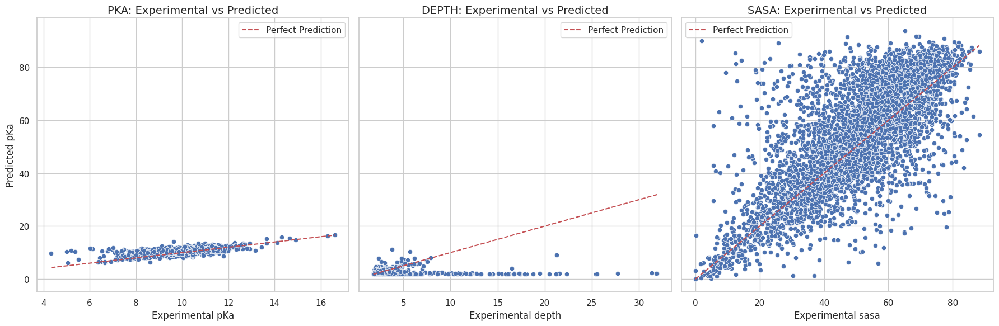

In [ ]:
features = ['pKa', 'depth', 'sasa']

fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)

for i, feature in enumerate(features):
    ax = axes[i]
    sns.scatterplot(
        x=merged_data[f'{feature}_exp'],
        y=merged_data[f'{feature}_pred'],
        ax=ax
    )

    ax.plot(
        [merged_data[f'{feature}_exp'].min(), merged_data[f'{feature}_exp'].max()],
        [merged_data[f'{feature}_exp'].min(), merged_data[f'{feature}_exp'].max()],
        'r--', label="Perfect Prediction"
    )
    ax.set_title(f'{feature.upper()}: Experimental vs Predicted', fontsize=14)
    ax.set_xlabel(f'Experimental {feature}', fontsize=12)
    if i == 0:
        ax.set_ylabel(f'Predicted {feature}', fontsize=12)
    ax.legend()

plt.tight_layout()
plt.show()

# PAL DATASET

In [ ]:
import pandas as pd
import numpy as np
from sklearn.utils import resample
from scipy.ndimage import gaussian_filter1d

exp_data = pd.read_csv('/content/drive/MyDrive/gather_out/ex_data.csv')
pre_data = pd.read_csv('/content/drive/MyDrive/gather_out/pre_data.csv')

merged_data = pd.merge(exp_data, pre_data, on=['Uniprot_Entry', 'Resid'], suffixes=('_exp', '_pred'))

# Calculate overall deviation (pKa only)
pKa_bias = (merged_data['pKa_pred'] - merged_data['pKa_exp']).mean()
print(f"Calculated Bias for pKa: {pKa_bias:.4f}")

# Extract label1 data from unmatched prediction data
common_index = merged_data.set_index(['Uniprot_Entry', 'Resid']).index
pre_data_filtered = pre_data[~pre_data.set_index(['Uniprot_Entry', 'Resid']).index.isin(common_index)]

# Select only label1 data
label1_data = pre_data_filtered[pre_data_filtered['label'] == 1].copy()

# Global bias correction for unmatched label1 data (pKa only)
label1_data['pKa'] -= pKa_bias


# Remove outliers from SASA and depth
def remove_outliers_iqr(data, column):

    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    return data[(data[column] >= lower_bound) & (data[column] <= upper_bound)]

label1_data = remove_outliers_iqr(label1_data, 'sasa')
label1_data = remove_outliers_iqr(label1_data, 'depth')
label1_data = label1_data.sample(n=1530, random_state=42).copy()

# Merge experimental data and corrected label1 data
df_combined = pd.concat([exp_data, label1_data])

# Extract data with label 1
final_label1 = df_combined[df_combined['label'] == 1].copy()
final_label1 = final_label1.drop_duplicates()

# View the number of rows of data after extraction
print(f"The number of rows of label1 data extracted:{len(final_label1)}")

print(final_label1.head())


# Extract label0 data from experimental data

exp_label0 = exp_data[exp_data['label'] == 0].copy()

df3 = pd.read_csv('/content/drive/MyDrive/gather_out/non_glycation_data.csv')
matched_data = pd.merge(exp_label0, df3, on=['Uniprot_Entry', 'Resid'], how='inner')
matched_data = matched_data.drop_duplicates()

# Check whether the amount of matching data reaches 2000
num_matched = matched_data.shape[0]

# If the number of matching data is less than 2000
if num_matched < 2000:
    remaining_label0 = exp_label0[~exp_label0.set_index(['Uniprot_Entry', 'Resid']).index
                                  .isin(matched_data.set_index(['Uniprot_Entry', 'Resid']).index)]
    num_to_sample = 2000 - num_matched

    additional_data = resample(remaining_label0, n_samples=num_to_sample, random_state=42)

    final_label0 = pd.concat([matched_data, additional_data])
else:
    final_label0 = resample(matched_data, n_samples=2000, random_state=42)

# Data smoothing
smooth_data = pd.concat([final_label1, final_label0])

smoothed_file_path = '/content/drive/MyDrive/gather_out/PAL_data.csv'
smooth_data.to_csv(smoothed_file_path, index=False)

Calculated Bias for pKa: 0.3449
The number of rows of label1 data extracted:1836
   Uniprot_Entry  Resid  label     depth       pKa       sasa
18        P04075     14      1  2.058603  10.89250  63.445012
30        P04075    108      1  2.511164  10.64875  16.348787
35        P04075    140      1  1.922292  10.40375  63.838230
39        P04075    153      1  2.253182  10.28125  47.810168
47        P04075    230      1  6.176583   7.93500   4.241490


# Correlation analysis between the three features

            pKa      sasa     depth
pKa    1.000000  0.087468 -0.055210
sasa   0.087468  1.000000 -0.156051
depth -0.055210 -0.156051  1.000000


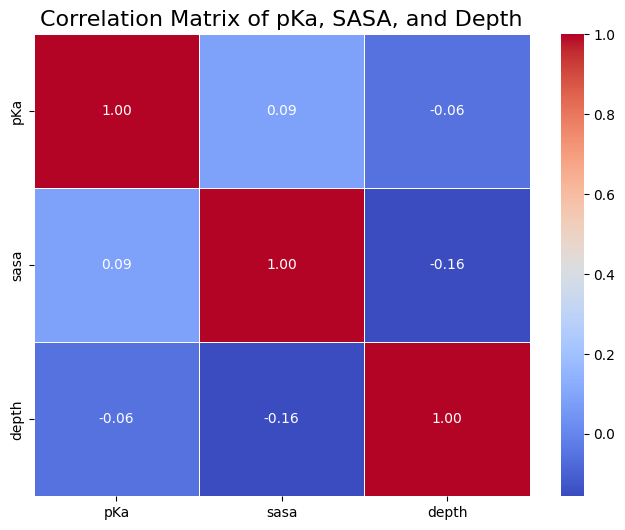

In [ ]:
df_exp = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')
df_exp = df_exp.dropna(subset=['pKa', 'sasa', 'depth'])
data = df_exp[['pKa', 'sasa', 'depth']]

correlation_matrix = data.corr()
print(correlation_matrix)

plt.figure(figsize=(8, 6))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt='.2f', linewidths=0.5)
plt.title('Correlation Matrix of pKa, SASA, and Depth', fontsize=16)
plt.show()

# SVM with 3 features

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/gather_out/exp_dataset.csv')

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

In [ ]:
X = data[['pKa', 'depth','sasa']]
y = data['label']

X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
svm = SVC(kernel='rbf', probability=True, class_weight='balanced', random_state=2)
svm.fit(X_train, y_train)

y_pred = svm.predict(X_test)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.61      0.84      0.70       388
           1       0.73      0.45      0.56       380

    accuracy                           0.64       768
   macro avg       0.67      0.64      0.63       768
weighted avg       0.67      0.64      0.63       768

Confusion Matrix:
 [[324  64]
 [209 171]]


In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'depth','sasa']]
y = data['label']

# random oversampling
#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Defining the parameter grid
param_grid = {'C': [0.1, 1, 10, 100], 'gamma': [0.001, 0.01, 0.1, 1]}

# Creating SVM Model
svm = SVC(kernel='rbf', probability=True, class_weight='balanced', random_state=2)

# Using grid search and cross validation
grid_search = GridSearchCV(svm, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Output the best parameters and corresponding accuracy
print("Best parameters:", grid_search.best_params_)
print("Best accuracy:", grid_search.best_score_)

# Evaluate on the test set using the best parameters
best_svm = grid_search.best_estimator_
accuracy = best_svm.score(X_test, y_test)
print("Test set accuracy:", accuracy)

# Compute classification report and confusion matrix
y_pred = best_svm.predict(X_test)
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)
matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", matrix)

Best parameters: {'C': 100, 'gamma': 1}
Best accuracy: 0.79595783007689
Test set accuracy: 0.7890625
Classification Report:
               precision    recall  f1-score   support

           0       0.77      0.83      0.80       388
           1       0.81      0.75      0.78       380

    accuracy                           0.79       768
   macro avg       0.79      0.79      0.79       768
weighted avg       0.79      0.79      0.79       768

Confusion Matrix:
 [[321  67]
 [ 95 285]]


In [ ]:
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
# Evaluate the best model using KFold cross validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_svm, X_train, y_train, cv=kf, scoring='accuracy')

# Output the results of K-Fold cross validation
print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

KFold Cross Validation Scores:  [0.7752443  0.80130293 0.78501629 0.80097879 0.76182708]
Mean KFold Accuracy:  0.7848738781344485
Standard Deviation of KFold Accuracy:  0.015186744506359656


# RF with 3 features

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'depth','sasa']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

rf = RandomForestClassifier(random_state = 42, class_weight = 'balanced')
rf.fit(X_train, y_train)

y_pred = rf.predict(X_test)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.93      0.90       388
           1       0.92      0.86      0.89       380

    accuracy                           0.89       768
   macro avg       0.90      0.89      0.89       768
weighted avg       0.90      0.89      0.89       768

Confusion Matrix:
 [[360  28]
 [ 53 327]]


In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'depth','sasa']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

param_grid = {
    'n_estimators': [10, 50, 100, 150],
    'max_depth':  [None, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestClassifier(random_state = 42, class_weight = 'balanced')
grid_search = GridSearchCV(rf, param_grid, cv = 5, scoring = 'accuracy')
grid_search.fit(X_train, y_train)
print("Best parameters:", grid_search.best_params_)
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 150}
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.93      0.90       388
           1       0.92      0.87      0.89       380

    accuracy                           0.90       768
   macro avg       0.90      0.90      0.90       768
weighted avg       0.90      0.90      0.90       768

Confusion Matrix:
 [[361  27]
 [ 51 329]]


In [ ]:
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_rf, X_train, y_train, cv=kf, scoring='accuracy')

print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

KFold Cross Validation Scores:  [0.87296417 0.87296417 0.86156352 0.87928222 0.85970636]
Mean KFold Accuracy:  0.8692960874855864
Standard Deviation of KFold Accuracy:  0.007461741462515743


In [ ]:
import pandas as pd
import numpy as np
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split
from sklearn.utils import resample

data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'depth', 'sasa']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

mask_positive = y_train == 1
X_train_positive = X_train[mask_positive]

mask_negative = y_train == 0
X_train_negative = X_train[mask_negative]

scatter_trace_positive = go.Scatter3d(
    x=X_train_positive['pKa'],
    y=X_train_positive['depth'],
    z=X_train_positive['sasa'],
    mode='markers',
    marker=dict(
        color='red',
        size=4,
        opacity=0.6
    ),
    name='Class 1'
)

scatter_trace_negative = go.Scatter3d(
    x=X_train_negative['pKa'],
    y=X_train_negative['depth'],
    z=X_train_negative['sasa'],
    mode='markers',
    marker=dict(
        color='blue',
        size=4,
        opacity=0.6
    ),
    name='Class 0'
)

# Create a Figure object and add 3D scatter plot data of positive and negative samples
fig = go.Figure(data=[scatter_trace_positive, scatter_trace_negative])

fig.update_layout(
    title='Training Data Points Distribution',
    scene=dict(
        xaxis_title='pKa',
        yaxis_title='Depth(Å)',
        zaxis_title='SASA(Å²)',
        aspectratio=dict(x=1, y=1, z=1)
    ),
    width=1000,
    height=1000,
    legend=dict(
        x=0.1,
        y=0.9,
        bgcolor='rgba(255, 255, 255, 0.5)',
        bordercolor='black',
        borderwidth=1
    )
)

fig.show()

# KNN with 3 features

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'depth','sasa']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

knn = KNeighborsClassifier()
knn.fit(X_train, y_train)

y_pred = knn.predict(X_test)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

param_grid = {
    'n_neighbors': list(range(3, 8)),
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  # 1 represents Manhattan distance (L1), 2 represents Euclidean distance (L2)
}

# Creating a KNN Model
knn = KNeighborsClassifier()

# Tuning parameters using grid search
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)

# Use the model with the best parameters to make predictions and output the results
best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

Classification Report:
               precision    recall  f1-score   support

           0       0.73      0.78      0.76       388
           1       0.76      0.71      0.73       380

    accuracy                           0.75       768
   macro avg       0.75      0.75      0.75       768
weighted avg       0.75      0.75      0.75       768

Confusion Matrix:
 [[303  85]
 [110 270]]
Best parameters: {'n_neighbors': 4, 'p': 1, 'weights': 'distance'}
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.87      0.87       388
           1       0.87      0.87      0.87       380

    accuracy                           0.87       768
   macro avg       0.87      0.87      0.87       768
weighted avg       0.87      0.87      0.87       768

Confusion Matrix:
 [[339  49]
 [ 48 332]]


In [ ]:
# Evaluate the best model using KFold cross validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_knn, X_train, y_train, cv=kf, scoring='accuracy')

print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

KFold Cross Validation Scores:  [0.8485342  0.84690554 0.85179153 0.862969   0.84502447]
Mean KFold Accuracy:  0.851044949014565
Standard Deviation of KFold Accuracy:  0.0063627862095622075


# SVM with 2 features

##SVM pKa&SASA

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'sasa']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

# Defining the parameter grid
param_grid = {'C': [0.1, 1, 10, 100], 'gamma': [0.001, 0.01, 0.1, 1]}

# Creating SVM Model
svm = SVC(kernel='rbf', probability=True, class_weight='balanced', random_state=2)

# Using grid search and cross validation
grid_search = GridSearchCV(svm, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Output the best parameters and corresponding accuracy
print("Best parameters:", grid_search.best_params_)
print("Best accuracy:", grid_search.best_score_)

# Evaluate on the test set using the best parameters
best_svm = grid_search.best_estimator_
accuracy = best_svm.score(X_test, y_test)
print("Test set accuracy:", accuracy)

# Compute classification report and confusion matrix
y_pred = best_svm.predict(X_test)
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)
matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", matrix)

from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
# Evaluate the best model using KFold cross validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_svm, X_train, y_train, cv=kf, scoring='accuracy')

# Output the results of K-Fold cross validation
print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

Best parameters: {'C': 100, 'gamma': 1}
Best accuracy: 0.768574480182368
Test set accuracy: 0.7604166666666666
Classification Report:
               precision    recall  f1-score   support

           0       0.74      0.80      0.77       388
           1       0.78      0.72      0.75       380

    accuracy                           0.76       768
   macro avg       0.76      0.76      0.76       768
weighted avg       0.76      0.76      0.76       768

Confusion Matrix:
 [[311  77]
 [107 273]]
KFold Cross Validation Scores:  [0.76384365 0.75081433 0.74267101 0.79119086 0.74551387]
Mean KFold Accuracy:  0.7588067442119975
Standard Deviation of KFold Accuracy:  0.017748480696238692


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import plotly.graph_objects as go

# Data Standardization
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Training the best SVM model
best_svm.fit(X_train_scaled, y_train)

# Predicte test set
y_pred = best_svm.predict(X_test_scaled)

# Output classification report and confusion matrix
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Create a grid point range
pKa_range = np.linspace(X['pKa'].min(), X['pKa'].max(), 200)
SASA_range = np.linspace(X['sasa'].min(), X['sasa'].max(), 200)
pKa_grid, SASA_grid = np.meshgrid(pKa_range, SASA_range)
grid_points = np.c_[pKa_grid.ravel(), SASA_grid.ravel(),]

# Normalized grid points
grid_points_scaled = scaler.transform(grid_points)

# Predict the probability of a grid point
probabilities = best_svm.predict_proba(grid_points_scaled)

# Reshape the probability matrix
label1_probs = probabilities[:, 1].reshape(pKa_grid.shape)
label0_probs = probabilities[:, 0].reshape(pKa_grid.shape)

X_train_filtered = X_train[(X_train['pKa'] >= 0) & (X_train['pKa'] <= 100)]
y_train_filtered = y_train[(X_train['pKa'] >= 0) & (X_train['pKa'] <= 100)]

# Get two types of data points separately
class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]

# Create a scatter plot of Class 1
positive_trace = go.Scatter(
    x=class_1_data['pKa'],
    y=class_1_data['sasa'],
    mode='markers',
    marker=dict(color='red', size=6, opacity=0.5, line=dict(width=1, color='black')),
    name='Class 1'
)

# Create a scatter plot of Class 0
negative_trace = go.Scatter(
    x=class_0_data['pKa'],
    y=class_0_data['sasa'],
    mode='markers',
    marker=dict(color='blue', size=6, opacity=0.5, line=dict(width=1, color='black')),
    name='Class 0'
)


Classification Report:
               precision    recall  f1-score   support

           0       0.68      0.87      0.76       388
           1       0.81      0.58      0.68       380

    accuracy                           0.73       768
   macro avg       0.75      0.73      0.72       768
weighted avg       0.75      0.73      0.72       768

Confusion Matrix:
 [[337  51]
 [158 222]]


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



In [ ]:
import plotly.graph_objects as go

mask_train = (X_train['sasa'] >= 0) & (X_train['sasa'] <= 100)
X_train_filtered = X_train[mask_train]
y_train_filtered = y_train[mask_train]

# Get the data points of two categories separately
class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]
positive_trace = go.Scatter(
    x = X_train[y_train_filtered == 1]['pKa'],
    y = X_train[y_train_filtered == 1]['sasa'],
    mode ='markers',
    marker = dict(
        color ='red',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 1'
)

negative_trace = go.Scatter(
    x = X_train_filtered[y_train_filtered == 0]['pKa'],
    y = X_train_filtered[y_train_filtered == 0]['sasa'],
    mode ='markers',
    marker = dict(
        color = 'blue',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 0'
)

# Create probability graph 1 and set showlegend to True to display the legend of the graph.
probability_trace1 = go.Contour(
    x = pKa_range,
    y = SASA_range,
    z = label1_probs,
    colorscale = 'reds',
    opacity = 0.5,
    name = 'Class 1',
    showlegend=True,
    colorbar=dict(
        x=1.1,  # Set the position of the color bar on the x-axis (value range 0 to 1)
        y=0.5,  # Set the position of the color bar on the y-axis (value range 0 to 1)

    )
)

# Create probability graph 0 and set showlegend to True to display the legend of the graph, and set appropriate style attributes such as colorscale
probability_trace0 = go.Contour(
    x = pKa_range,
    y = SASA_range,
    z = label0_probs,
    colorscale = 'blues',
    opacity = 0.5,
    name = 'Class 0',
    showlegend=True,
    colorbar=dict(
        x=1,  # Set the position of the color bar on the x-axis (value range 0 to 1)
        y=0.5,  # Set the position of the color bar on the y-axis (value range 0 to 1)
    )
)

# Create a Figure object and add scatter plot and probability plot data
fig = go.Figure(data =[positive_trace, negative_trace, probability_trace1, probability_trace0])

# Set the layout and configure legend related properties
fig.update_layout(
    title = 'Training Data Points Distribution ',
    xaxis_title = 'pKa',
    yaxis_title = 'SASA(Å²)',
    hovermode = 'closest',
    width = 1000,
    height = 700,
    legend = dict(
        x = 0.1,
        y = 0.9,
        bgcolor = 'rgba(255,255,255,0.5)',
        bordercolor = 'black',
        borderwidth = 1,
    )
)

fig.show()

## SVM pKa&depth

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'depth']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

param_grid = {'C': [0.1, 1, 10, 100], 'gamma': [0.001, 0.01, 0.1, 1]}

svm = SVC(kernel='rbf', probability=True, class_weight='balanced', random_state=2)

grid_search = GridSearchCV(svm, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)
print("Best accuracy:", grid_search.best_score_)

best_svm = grid_search.best_estimator_
accuracy = best_svm.score(X_test, y_test)
print("Test set accuracy:", accuracy)

y_pred = best_svm.predict(X_test)
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)
matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", matrix)

from sklearn.model_selection import GridSearchCV, KFold, cross_val_score

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_svm, X_train, y_train, cv=kf, scoring='accuracy')

print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

Best parameters: {'C': 1, 'gamma': 1}
Best accuracy: 0.7376155076491437
Test set accuracy: 0.7135416666666666
Classification Report:
               precision    recall  f1-score   support

           0       0.69      0.79      0.74       388
           1       0.75      0.64      0.69       380

    accuracy                           0.71       768
   macro avg       0.72      0.71      0.71       768
weighted avg       0.72      0.71      0.71       768

Confusion Matrix:
 [[306  82]
 [138 242]]
KFold Cross Validation Scores:  [0.70846906 0.77198697 0.7247557  0.72104405 0.73083197]
Mean KFold Accuracy:  0.7314175491920444
Standard Deviation of KFold Accuracy:  0.02156313535923277


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import plotly.graph_objects as go

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

best_svm.fit(X_train_scaled, y_train)

y_pred = best_svm.predict(X_test_scaled)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

pKa_range = np.linspace(X['pKa'].min(), X['pKa'].max(), 200)
depth_range = np.linspace(X['depth'].min(), X['depth'].max(), 200)
pKa_grid, depth_grid = np.meshgrid(pKa_range, depth_range)
grid_points = np.c_[pKa_grid.ravel(), depth_grid.ravel(),]

grid_points_scaled = scaler.transform(grid_points)

probabilities = best_svm.predict_proba(grid_points_scaled)

label1_probs = probabilities[:, 1].reshape(pKa_grid.shape)
label0_probs = probabilities[:, 0].reshape(pKa_grid.shape)

X_train_filtered = X_train[(X_train['pKa'] >= 0) & (X_train['pKa'] <= 100)]
y_train_filtered = y_train[(X_train['pKa'] >= 0) & (X_train['pKa'] <= 100)]

class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]

positive_trace = go.Scatter(
    x=class_1_data['pKa'],
    y=class_1_data['depth'],
    mode='markers',
    marker=dict(color='red', size=6, opacity=0.5, line=dict(width=1, color='black')),
    name='Class 1'
)

negative_trace = go.Scatter(
    x=class_0_data['pKa'],
    y=class_0_data['depth'],
    mode='markers',
    marker=dict(color='blue', size=6, opacity=0.5, line=dict(width=1, color='black')),
    name='Class 0'
)

Classification Report:
               precision    recall  f1-score   support

           0       0.71      0.75      0.73       388
           1       0.73      0.69      0.71       380

    accuracy                           0.72       768
   macro avg       0.72      0.72      0.72       768
weighted avg       0.72      0.72      0.72       768

Confusion Matrix:
 [[291  97]
 [118 262]]


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



In [ ]:
import plotly.graph_objects as go

mask_train = (X_train['pKa'] >= 0) & (X_train['pKa'] <= 100)
X_train_filtered = X_train[mask_train]
y_train_filtered = y_train[mask_train]

class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]
positive_trace = go.Scatter(
    x = X_train[y_train_filtered == 1]['pKa'],
    y = X_train[y_train_filtered == 1]['depth'],
    mode ='markers',
    marker = dict(
        color ='red',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 1'
)

negative_trace = go.Scatter(
    x = X_train_filtered[y_train_filtered == 0]['pKa'],
    y = X_train_filtered[y_train_filtered == 0]['depth'],
    mode ='markers',
    marker = dict(
        color = 'blue',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 0'
)

probability_trace1 = go.Contour(
    x = pKa_range,
    y = depth_range,
    z = label1_probs,
    colorscale = 'reds',
    opacity = 0.5,
    name = 'Class 1',
    showlegend=True,
    colorbar=dict(
        x=1.1,
        y=0.5,

    )
)

probability_trace0 = go.Contour(
    x = pKa_range,
    y = depth_range,
    z = label0_probs,
    colorscale = 'blues',
    opacity = 0.5,
    name = 'Class 0',
    showlegend=True,
    colorbar=dict(
        x=1,
        y=0.5,
    )
)

fig = go.Figure(data =[positive_trace, negative_trace, probability_trace1, probability_trace0])

fig.update_layout(
    title = 'Training Data Points Distribution ',
    xaxis_title = 'pKa',
    yaxis_title = 'depth(Å)',
    hovermode = 'closest',
    width = 1000,
    height = 700,
    legend = dict(
        x = 0.1,
        y = 0.9,
        bgcolor = 'rgba(255,255,255,0.5)',
        bordercolor = 'black',
        borderwidth = 1,
    )
)

fig.show()

## SVM depth&SASA

In [ ]:
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['sasa', 'depth']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

param_grid = {'C': [0.1, 1, 10, 100], 'gamma': [0.001, 0.01, 0.1, 1]}

svm = SVC(kernel='rbf', probability=True, class_weight='balanced', random_state=2)

grid_search = GridSearchCV(svm, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)
print("Best accuracy:", grid_search.best_score_)

best_svm = grid_search.best_estimator_
accuracy = best_svm.score(X_test, y_test)
print("Test set accuracy:", accuracy)

y_pred = best_svm.predict(X_test)
report = classification_report(y_test, y_pred)
print("Classification Report:\n", report)
matrix = confusion_matrix(y_test, y_pred)
print("Confusion Matrix:\n", matrix)

from sklearn.model_selection import GridSearchCV, KFold, cross_val_score

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_svm, X_train, y_train, cv=kf, scoring='accuracy')

print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

Best parameters: {'C': 10, 'gamma': 1}
Best accuracy: 0.6851310636534159
Test set accuracy: 0.6744791666666666
Classification Report:
               precision    recall  f1-score   support

           0       0.67      0.72      0.69       388
           1       0.69      0.63      0.66       380

    accuracy                           0.67       768
   macro avg       0.68      0.67      0.67       768
weighted avg       0.68      0.67      0.67       768

Confusion Matrix:
 [[278 110]
 [140 240]]
KFold Cross Validation Scores:  [0.66123779 0.69543974 0.66286645 0.69331158 0.65089723]
Mean KFold Accuracy:  0.6727505566153535
Standard Deviation of KFold Accuracy:  0.018140354493778203


In [ ]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import plotly.graph_objects as go

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

best_svm.fit(X_train_scaled, y_train)

y_pred = best_svm.predict(X_test_scaled)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

sasa_range = np.linspace(X['sasa'].min(), X['sasa'].max(), 200)
depth_range = np.linspace(X['depth'].min(), X['depth'].max(), 200)
sasa_grid, depth_grid = np.meshgrid(sasa_range, depth_range)
grid_points = np.c_[sasa_grid.ravel(), depth_grid.ravel(),]

grid_points_scaled = scaler.transform(grid_points)

probabilities = best_svm.predict_proba(grid_points_scaled)

label1_probs = probabilities[:, 1].reshape(sasa_grid.shape)
label0_probs = probabilities[:, 0].reshape(sasa_grid.shape)

X_train_filtered = X_train[(X_train['depth'] >= 0) & (X_train['depth'] <= 100)]
y_train_filtered = y_train[(X_train['depth'] >= 0) & (X_train['depth'] <= 100)]

class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]

positive_trace = go.Scatter(
    x=class_1_data['sasa'],
    y=class_1_data['depth'],
    mode='markers',
    marker=dict(color='red', size=6, opacity=0.5, line=dict(width=1, color='black')),
    name='Class 1'
)

negative_trace = go.Scatter(
    x=class_0_data['sasa'],
    y=class_0_data['depth'],
    mode='markers',
    marker=dict(color='blue', size=6, opacity=0.5, line=dict(width=1, color='black')),
    name='Class 0'
)

Classification Report:
               precision    recall  f1-score   support

           0       0.63      0.77      0.69       388
           1       0.69      0.53      0.60       380

    accuracy                           0.65       768
   macro avg       0.66      0.65      0.64       768
weighted avg       0.66      0.65      0.64       768

Confusion Matrix:
 [[297  91]
 [178 202]]


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



In [ ]:
import plotly.graph_objects as go

mask_train = (X_train['depth'] >= 0) & (X_train['depth'] <= 100)
X_train_filtered = X_train[mask_train]
y_train_filtered = y_train[mask_train]

class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]
positive_trace = go.Scatter(
    x = X_train[y_train_filtered == 1]['sasa'],
    y = X_train[y_train_filtered == 1]['depth'],
    mode ='markers',
    marker = dict(
        color ='red',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 1'
)

negative_trace = go.Scatter(
    x = X_train_filtered[y_train_filtered == 0]['sasa'],
    y = X_train_filtered[y_train_filtered == 0]['depth'],
    mode ='markers',
    marker = dict(
        color = 'blue',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 0'
)

probability_trace1 = go.Contour(
    x = sasa_range,
    y = depth_range,
    z = label1_probs,
    colorscale = 'reds',
    opacity = 0.5,
    name = 'Class 1',
    showlegend=True,
    colorbar=dict(
        x=1.1,
        y=0.5,

    )
)

probability_trace0 = go.Contour(
    x = sasa_range,
    y = depth_range,
    z = label0_probs,
    colorscale = 'blues',
    opacity = 0.5,
    name = 'Class 0',
    showlegend=True,
    colorbar=dict(
        x=1,
        y=0.5,
    )
)

fig = go.Figure(data =[positive_trace, negative_trace, probability_trace1, probability_trace0])

fig.update_layout(
    title = 'Training Data Points Distribution ',
    xaxis_title = 'sasa(Å²)',
    yaxis_title = 'depth(Å)',
    hovermode = 'closest',
    width = 1000,
    height = 700,
    legend = dict(
        x = 0.1,
        y = 0.9,
        bgcolor = 'rgba(255,255,255,0.5)',
        bordercolor = 'black',
        borderwidth = 1,
    )
)

fig.show()

# RF with 2 features

## RF pKa&SASA

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, KFold, cross_val_score
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'sasa']]
y = data['label']


#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

param_grid = {
    'n_estimators': [10, 50, 100, 150],
    'max_depth':  [None, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestClassifier(random_state = 42, class_weight = 'balanced')
grid_search = GridSearchCV(rf, param_grid, cv = 5, scoring = 'accuracy')
grid_search.fit(X_train, y_train)
print("Best parameters:", grid_search.best_params_)
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_rf, X_train, y_train, cv=kf, scoring='accuracy')

print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Training the best random forest model
best_rf.fit(X_train_scaled, y_train)

y_pred = best_rf.predict(X_test_scaled)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

pKa_range = np.linspace(data['pKa'].min(), data['pKa'].max(), 200)
SASA_range = np.linspace(data['sasa'].min(), data['sasa'].max(), 200)
pKa_grid, SASA_grid = np.meshgrid(pKa_range, SASA_range)
grid_points = np.c_[pKa_grid.ravel(), SASA_grid.ravel()]

grid_points_scaled = scaler.transform(grid_points)

probabilities = best_rf.predict_proba(grid_points_scaled)

label1_probs = probabilities[:, 1].reshape(pKa_grid.shape)
label0_probs = probabilities[:, 0].reshape(pKa_grid.shape)

Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 50}
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.90      0.87       388
           1       0.89      0.84      0.86       380

    accuracy                           0.87       768
   macro avg       0.87      0.87      0.87       768
weighted avg       0.87      0.87      0.87       768

Confusion Matrix:
 [[348  40]
 [ 62 318]]
KFold Cross Validation Scores:  [0.8534202  0.85504886 0.84690554 0.85807504 0.84665579]
Mean KFold Accuracy:  0.852021084961555
Standard Deviation of KFold Accuracy:  0.004532780956572369
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.90      0.87       388
           1       0.89      0.84      0.86       380

    accuracy                           0.87       768
   macro avg       0.87      0.87      0.87       768
weighted avg       0.87      0.87      0.8

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



In [ ]:
import plotly.graph_objects as go

mask_train = (X_train['sasa'] >= 0) & (X_train['sasa'] <= 1000)
X_train_filtered = X_train[mask_train]
y_train_filtered = y_train[mask_train]

class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]

positive_trace = go.Scatter(
    x = X_train[y_train_filtered == 1]['pKa'],
    y = X_train[y_train_filtered == 1]['sasa'],
    mode ='markers',
    marker = dict(
        color ='red',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 1'
)

negative_trace = go.Scatter(
    x = X_train_filtered[y_train_filtered == 0]['pKa'],
    y = X_train_filtered[y_train_filtered == 0]['sasa'],
    mode ='markers',
    marker = dict(
        color = 'blue',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 0'
)

probability_trace1 = go.Contour(
    x = pKa_range,
    y = SASA_range,
    z = label1_probs,
    colorscale = 'reds',
    opacity = 0.5,
    name = 'Class 1',
    showlegend=True,
    colorbar=dict(
        x=1.1,
        y=0.5,

    )
)

probability_trace0 = go.Contour(
    x = pKa_range,
    y = SASA_range,
    z = label0_probs,
    colorscale = 'blues',
    opacity = 0.5,
    name = 'Class 0',
    showlegend=True,
    colorbar=dict(
        x=1,
        y=0.5,
    )
)

fig = go.Figure(data =[positive_trace, negative_trace, probability_trace1, probability_trace0])

fig.update_layout(
    title = 'Training Data Points Distribution ',
    xaxis=dict(
        title='pKa',
        range=None
    ),
    yaxis=dict(
        title='SASA(Å²)',
        range=None
    ),
    #xaxis_title = 'pKa',
    #yaxis_title = 'SASA(Å²)',
    hovermode = 'closest',
    width = 1000,
    height = 700,
    legend = dict(
        x = 0.1,
        y = 0.9,
        bgcolor = 'rgba(255,255,255,0.5)',
        bordercolor = 'black',
        borderwidth = 1,
    )
)

fig.show()

## RF pKa&depth

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'depth']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

param_grid = {
    'n_estimators': [10, 50, 100, 150],
    'max_depth':  [None, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestClassifier(random_state = 42, class_weight = 'balanced')
grid_search = GridSearchCV(rf, param_grid, cv = 5, scoring = 'accuracy')
grid_search.fit(X_train, y_train)
print("Best parameters:", grid_search.best_params_)
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_rf, X_train, y_train, cv=kf, scoring='accuracy')

print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

best_rf.fit(X_train_scaled, y_train)

y_pred = best_rf.predict(X_test_scaled)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

pKa_range = np.linspace(data['pKa'].min(), data['pKa'].max(), 200)
depth_range = np.linspace(data['depth'].min(), data['depth'].max(), 200)
pKa_grid, depth_grid = np.meshgrid(pKa_range, depth_range)
grid_points = np.c_[pKa_grid.ravel(), depth_grid.ravel()]

grid_points_scaled = scaler.transform(grid_points)

probabilities = best_rf.predict_proba(grid_points_scaled)

label1_probs = probabilities[:, 1].reshape(pKa_grid.shape)
label0_probs = probabilities[:, 0].reshape(pKa_grid.shape)

import plotly.graph_objects as go

mask_train = (X_train['pKa'] >= 0) & (X_train['pKa'] <= 1000)
X_train_filtered = X_train[mask_train]
y_train_filtered = y_train[mask_train]

class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]

positive_trace = go.Scatter(
    x = X_train[y_train_filtered == 1]['pKa'],
    y = X_train[y_train_filtered == 1]['depth'],
    mode ='markers',
    marker = dict(
        color ='red',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 1'
)

negative_trace = go.Scatter(
    x = X_train_filtered[y_train_filtered == 0]['pKa'],
    y = X_train_filtered[y_train_filtered == 0]['depth'],
    mode ='markers',
    marker = dict(
        color = 'blue',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 0'
)

probability_trace1 = go.Contour(
    x = pKa_range,
    y = depth_range,
    z = label1_probs,
    colorscale = 'reds',
    opacity = 0.5,
    name = 'Class 1',
    showlegend=True,
    colorbar=dict(
        x=1.1,
        y=0.5,

    )
)

probability_trace0 = go.Contour(
    x = pKa_range,
    y = depth_range,
    z = label0_probs,
    colorscale = 'blues',
    opacity = 0.5,
    name = 'Class 0',
    showlegend=True,
    colorbar=dict(
        x=1,
        y=0.5,
    )
)

fig = go.Figure(data =[positive_trace, negative_trace, probability_trace1, probability_trace0])

fig.update_layout(
    title = 'Training Data Points Distribution ',
    xaxis_title = 'pKa',
    yaxis_title = 'depth(Å)',
    hovermode = 'closest',
    width = 1000,
    height = 700,
    legend = dict(
        x = 0.1,
        y = 0.9,
        bgcolor = 'rgba(255,255,255,0.5)',
        bordercolor = 'black',
        borderwidth = 1,
    )
)

fig.show()

Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.89      0.88       388
           1       0.89      0.87      0.88       380

    accuracy                           0.88       768
   macro avg       0.88      0.88      0.88       768
weighted avg       0.88      0.88      0.88       768

Confusion Matrix:
 [[346  42]
 [ 51 329]]
KFold Cross Validation Scores:  [0.84039088 0.86807818 0.83550489 0.86786297 0.85154976]
Mean KFold Accuracy:  0.8526773331349535
Standard Deviation of KFold Accuracy:  0.01352708993507593
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.89      0.88       388
           1       0.89      0.86      0.88       380

    accuracy                           0.88       768
   macro avg       0.88      0.88      0.88       768
weighted avg       0.88      0.88      0.

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



## RF depth&SASA

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.datasets import make_classification
from sklearn.model_selection import train_test_split
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['sasa', 'depth']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)

param_grid = {
    'n_estimators': [10, 50, 100, 150],
    'max_depth':  [None, 5, 10, 15],
    'min_samples_leaf': [1, 2, 4]
}

rf = RandomForestClassifier(random_state = 42, class_weight = 'balanced')
grid_search = GridSearchCV(rf, param_grid, cv = 5, scoring = 'accuracy')
grid_search.fit(X_train, y_train)
print("Best parameters:", grid_search.best_params_)
best_rf = grid_search.best_estimator_
y_pred = best_rf.predict(X_test)
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_rf, X_train, y_train, cv=kf, scoring='accuracy')

print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

best_rf.fit(X_train_scaled, y_train)

y_pred = best_rf.predict(X_test_scaled)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

sasa_range = np.linspace(data['sasa'].min(), data['sasa'].max(), 200)
depth_range = np.linspace(data['depth'].min(), data['depth'].max(), 200)
sasa_grid, depth_grid = np.meshgrid(sasa_range, depth_range)
grid_points = np.c_[sasa_grid.ravel(), depth_grid.ravel()]

grid_points_scaled = scaler.transform(grid_points)

probabilities = best_rf.predict_proba(grid_points_scaled)

label1_probs = probabilities[:, 1].reshape(sasa_grid.shape)
label0_probs = probabilities[:, 0].reshape(sasa_grid.shape)

import plotly.graph_objects as go

mask_train = (X_train['sasa'] >= 0) & (X_train['sasa'] <= 1000)
X_train_filtered = X_train[mask_train]
y_train_filtered = y_train[mask_train]

class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]

positive_trace = go.Scatter(
    x = X_train[y_train_filtered == 1]['sasa'],
    y = X_train[y_train_filtered == 1]['depth'],
    mode ='markers',
    marker = dict(
        color ='red',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 1'
)

negative_trace = go.Scatter(
    x = X_train_filtered[y_train_filtered == 0]['sasa'],
    y = X_train_filtered[y_train_filtered == 0]['depth'],
    mode ='markers',
    marker = dict(
        color = 'blue',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 0'
)

probability_trace1 = go.Contour(
    x = sasa_range,
    y = depth_range,
    z = label1_probs,
    colorscale = 'reds',
    opacity = 0.5,
    name = 'Class 1',
    showlegend=True,
    colorbar=dict(
        x=1.1,
        y=0.5,

    )
)

probability_trace0 = go.Contour(
    x = sasa_range,
    y = depth_range,
    z = label0_probs,
    colorscale = 'blues',
    opacity = 0.5,
    name = 'Class 0',
    showlegend=True,
    colorbar=dict(
        x=1,
        y=0.5,
    )
)

fig = go.Figure(data =[positive_trace, negative_trace, probability_trace1, probability_trace0])

fig.update_layout(
    title = 'Training Data Points Distribution ',
    xaxis_title = 'SASA(Å²)',
    yaxis_title = 'depth(Å)',
    hovermode = 'closest',
    width = 1000,
    height = 700,
    legend = dict(
        x = 0.1,
        y = 0.9,
        bgcolor = 'rgba(255,255,255,0.5)',
        bordercolor = 'black',
        borderwidth = 1,
    )
)

fig.show()

Best parameters: {'max_depth': None, 'min_samples_leaf': 1, 'n_estimators': 100}
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.86      0.85       388
           1       0.86      0.84      0.85       380

    accuracy                           0.85       768
   macro avg       0.85      0.85      0.85       768
weighted avg       0.85      0.85      0.85       768

Confusion Matrix:
 [[334  54]
 [ 61 319]]
KFold Cross Validation Scores:  [0.81433225 0.80130293 0.81596091 0.84991843 0.84828711]
Mean KFold Accuracy:  0.8259603275395742
Standard Deviation of KFold Accuracy:  0.01957377797039906
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.86      0.85       388
           1       0.85      0.83      0.84       380

    accuracy                           0.85       768
   macro avg       0.85      0.84      0.84       768
weighted avg       0.85      0.85      0.

/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



# KNN with 2 features

## pKa&SASA

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'sasa']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
param_grid = {
    'n_neighbors': list(range(3, 8)),
    'weights': ['uniform', 'distance'],
    'p': [1, 2]  # 1 represents Manhattan distance (L1), 2 represents Euclidean distance (L2)
}

# Creating a KNN Model
knn = KNeighborsClassifier()

# Tuning parameters using grid search
grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

# Output the best parameters
print("Best parameters:", grid_search.best_params_)

# Use the model with the best parameters to make predictions and output the results
best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Evaluate the best model using K-Fold cross validation
kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_knn, X_train, y_train, cv=kf, scoring='accuracy')

# Output the results of K-Fold cross validation
print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

# Data Standardization
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Training the best KNN model
best_knn.fit(X_train_scaled, y_train)

# Predict test set
y_pred = best_knn.predict(X_test_scaled)

# Output classification report and confusion matrix
print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

# Creating Grid Points
pKa_range = np.linspace(data['pKa'].min(), data['pKa'].max(), 200)
sasa_range = np.linspace(data['sasa'].min(), data['sasa'].max(), 200)
pKa_grid, sasa_grid = np.meshgrid(pKa_range, sasa_range)
grid_points = np.c_[pKa_grid.ravel(), sasa_grid.ravel()]

# Normalized grid points
grid_points_scaled = scaler.transform(grid_points)

# Predict the probability of a grid point
probabilities = best_knn.predict_proba(grid_points_scaled)

# Reshape the probability matrix
label1_probs = probabilities[:, 1].reshape(pKa_grid.shape)
label0_probs = probabilities[:, 0].reshape(pKa_grid.shape)

import plotly.graph_objects as go

mask_train = (X_train['pKa'] >= 0) & (X_train['pKa'] <= 1000)
X_train_filtered = X_train[mask_train]
y_train_filtered = y_train[mask_train]

# Get the data points of two categories separately
class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]

positive_trace = go.Scatter(
    x = X_train[y_train_filtered == 1]['pKa'],
    y = X_train[y_train_filtered == 1]['sasa'],
    mode ='markers',
    marker = dict(
        color ='red',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 1'
)

negative_trace = go.Scatter(
    x = X_train_filtered[y_train_filtered == 0]['pKa'],
    y = X_train_filtered[y_train_filtered == 0]['sasa'],
    mode ='markers',
    marker = dict(
        color = 'blue',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 0'
)

probability_trace1 = go.Contour(
    x = pKa_range,
    y = sasa_range,
    z = label1_probs,
    colorscale = 'reds',
    opacity = 0.5,
    name = 'Class 1',
    showlegend=True,
    colorbar=dict(
        x=1.1,
        y=0.5,

    )
)

probability_trace0 = go.Contour(
    x = pKa_range,
    y = sasa_range,
    z = label0_probs,
    colorscale = 'blues',
    opacity = 0.5,
    name = 'Class 0',
    showlegend=True,
    colorbar=dict(
        x=1,
        y=0.5,
    )
)

fig = go.Figure(data =[positive_trace, negative_trace, probability_trace1, probability_trace0])

fig.update_layout(
    title = 'Training Data Points Distribution ',
    xaxis_title = 'pKa',
    yaxis_title = 'SASA(Å²)',
    hovermode = 'closest',
    width = 1000,
    height = 700,
    legend = dict(
        x = 0.1,
        y = 0.9,
        bgcolor = 'rgba(255,255,255,0.5)',
        bordercolor = 'black',
        borderwidth = 1,
    )
)

fig.show()

Best parameters: {'n_neighbors': 7, 'p': 2, 'weights': 'distance'}
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.89      0.87       388
           1       0.88      0.85      0.87       380

    accuracy                           0.87       768
   macro avg       0.87      0.87      0.87       768
weighted avg       0.87      0.87      0.87       768

Confusion Matrix:
 [[344  44]
 [ 56 324]]
KFold Cross Validation Scores:  [0.83061889 0.83713355 0.83876221 0.86786297 0.84013051]
Mean KFold Accuracy:  0.8429016265389949
Standard Deviation of KFold Accuracy:  0.012899757462608748
Classification Report:
               precision    recall  f1-score   support

           0       0.85      0.90      0.88       388
           1       0.89      0.84      0.87       380

    accuracy                           0.87       768
   macro avg       0.87      0.87      0.87       768
weighted avg       0.87      0.87      0.87       768


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



## pKa&depth

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['pKa', 'depth']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
param_grid = {
    'n_neighbors': list(range(3, 8)),
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

knn = KNeighborsClassifier()

grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)


print("Best parameters:", grid_search.best_params_)

best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_knn, X_train, y_train, cv=kf, scoring='accuracy')

print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

best_knn.fit(X_train_scaled, y_train)

y_pred = best_knn.predict(X_test_scaled)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

pKa_range = np.linspace(data['pKa'].min(), data['pKa'].max(), 200)
depth_range = np.linspace(data['depth'].min(), data['depth'].max(), 200)
pKa_grid, depth_grid = np.meshgrid(pKa_range, depth_range)
grid_points = np.c_[pKa_grid.ravel(), depth_grid.ravel()]

grid_points_scaled = scaler.transform(grid_points)

probabilities = best_knn.predict_proba(grid_points_scaled)

label1_probs = probabilities[:, 1].reshape(pKa_grid.shape)
label0_probs = probabilities[:, 0].reshape(pKa_grid.shape)

import plotly.graph_objects as go

mask_train = (X_train['pKa'] >= 0) & (X_train['pKa'] <= 1000)
X_train_filtered = X_train[mask_train]
y_train_filtered = y_train[mask_train]

class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]

positive_trace = go.Scatter(
    x = X_train[y_train_filtered == 1]['pKa'],
    y = X_train[y_train_filtered == 1]['depth'],
    mode ='markers',
    marker = dict(
        color ='red',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 1'
)

negative_trace = go.Scatter(
    x = X_train_filtered[y_train_filtered == 0]['pKa'],
    y = X_train_filtered[y_train_filtered == 0]['depth'],
    mode ='markers',
    marker = dict(
        color = 'blue',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 0'
)

probability_trace1 = go.Contour(
    x = pKa_range,
    y = depth_range,
    z = label1_probs,
    colorscale = 'reds',
    opacity = 0.5,
    name = 'Class 1',
    showlegend=True,
    colorbar=dict(
        x=1.1,
        y=0.5,

    )
)

probability_trace0 = go.Contour(
    x = pKa_range,
    y = depth_range,
    z = label0_probs,
    colorscale = 'blues',
    opacity = 0.5,
    name = 'Class 0',
    showlegend=True,
    colorbar=dict(
        x=1,
        y=0.5,
    )
)

fig = go.Figure(data =[positive_trace, negative_trace, probability_trace1, probability_trace0])

fig.update_layout(
    title = 'Training Data Points Distribution ',
    xaxis_title = 'pKa',
    yaxis_title = 'depth(Å)',
    hovermode = 'closest',
    width = 1000,
    height = 700,
    legend = dict(
        x = 0.1,
        y = 0.9,
        bgcolor = 'rgba(255,255,255,0.5)',
        bordercolor = 'black',
        borderwidth = 1,
    )
)

fig.show()

Best parameters: {'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Classification Report:
               precision    recall  f1-score   support

           0       0.86      0.89      0.87       388
           1       0.88      0.85      0.86       380

    accuracy                           0.87       768
   macro avg       0.87      0.87      0.87       768
weighted avg       0.87      0.87      0.87       768

Confusion Matrix:
 [[345  43]
 [ 58 322]]
KFold Cross Validation Scores:  [0.84039088 0.85179153 0.85016287 0.83523654 0.82707993]
Mean KFold Accuracy:  0.8409323506437609
Standard Deviation of KFold Accuracy:  0.009249314317505029
Classification Report:
               precision    recall  f1-score   support

           0       0.87      0.89      0.88       388
           1       0.88      0.87      0.87       380

    accuracy                           0.88       768
   macro avg       0.88      0.88      0.88       768
weighted avg       0.88      0.88      0.88       768


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



## depth&SASA

In [ ]:
data = pd.read_csv('/content/drive/MyDrive/gather_out/PAL_data.csv')

X = data[['sasa', 'depth']]
y = data['label']

#class_weights = y.value_counts(normalize=True).to_dict()
X_resampled, y_resampled = resample(
    X, y,
    replace=True,
    n_samples=len(y),
    random_state=42,
    stratify=y
)

X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.2, random_state=42)
param_grid = {
    'n_neighbors': list(range(3, 8)),
    'weights': ['uniform', 'distance'],
    'p': [1, 2]
}

knn = KNeighborsClassifier()

grid_search = GridSearchCV(knn, param_grid, cv=5, scoring='accuracy')
grid_search.fit(X_train, y_train)

print("Best parameters:", grid_search.best_params_)

best_knn = grid_search.best_estimator_
y_pred = best_knn.predict(X_test)

from sklearn.metrics import classification_report, confusion_matrix

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

kf = KFold(n_splits=5, shuffle=True, random_state=42)
cv_scores = cross_val_score(best_knn, X_train, y_train, cv=kf, scoring='accuracy')

print("KFold Cross Validation Scores: ", cv_scores)
print("Mean KFold Accuracy: ", cv_scores.mean())
print("Standard Deviation of KFold Accuracy: ", cv_scores.std())

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

best_knn.fit(X_train_scaled, y_train)

y_pred = best_knn.predict(X_test_scaled)

print("Classification Report:\n", classification_report(y_test, y_pred))
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))

sasa_range = np.linspace(data['sasa'].min(), data['sasa'].max(), 200)
depth_range = np.linspace(data['depth'].min(), data['depth'].max(), 200)
sasa_grid, depth_grid = np.meshgrid(sasa_range, depth_range)
grid_points = np.c_[sasa_grid.ravel(), depth_grid.ravel()]

grid_points_scaled = scaler.transform(grid_points)

probabilities = best_knn.predict_proba(grid_points_scaled)

label1_probs = probabilities[:, 1].reshape(sasa_grid.shape)
label0_probs = probabilities[:, 0].reshape(sasa_grid.shape)

import plotly.graph_objects as go

mask_train = (X_train['depth'] >= 0) & (X_train['depth'] <= 1000)
X_train_filtered = X_train[mask_train]
y_train_filtered = y_train[mask_train]

class_0_data = X_train_filtered[y_train_filtered == 0]
class_1_data = X_train_filtered[y_train_filtered == 1]

positive_trace = go.Scatter(
    x = X_train[y_train_filtered == 1]['sasa'],
    y = X_train[y_train_filtered == 1]['depth'],
    mode ='markers',
    marker = dict(
        color ='red',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 1'
)

negative_trace = go.Scatter(
    x = X_train_filtered[y_train_filtered == 0]['sasa'],
    y = X_train_filtered[y_train_filtered == 0]['depth'],
    mode ='markers',
    marker = dict(
        color = 'blue',
        size = 6,
        line = dict(width = 1, color = 'black'),
        opacity = 0.5
    ),
    name = 'Class 0'
)

probability_trace1 = go.Contour(
    x = sasa_range,
    y = depth_range,
    z = label1_probs,
    colorscale = 'reds',
    opacity = 0.5,
    name = 'Class 1',
    showlegend=True,
    colorbar=dict(
        x=1.1,
        y=0.5,

    )
)

probability_trace0 = go.Contour(
    x = sasa_range,
    y = depth_range,
    z = label0_probs,
    colorscale = 'blues',
    opacity = 0.5,
    name = 'Class 0',
    showlegend=True,
    colorbar=dict(
        x=1,
        y=0.5,
    )
)

fig = go.Figure(data =[positive_trace, negative_trace, probability_trace1, probability_trace0])

fig.update_layout(
    title = 'Training Data Points Distribution ',
    xaxis_title = 'SASA(Å²)',
    yaxis_title = 'depth(Å)',
    hovermode = 'closest',
    width = 1000,
    height = 700,
    legend = dict(
        x = 0.1,
        y = 0.9,
        bgcolor = 'rgba(255,255,255,0.5)',
        bordercolor = 'black',
        borderwidth = 1,
    )
)

fig.show()

Best parameters: {'n_neighbors': 7, 'p': 1, 'weights': 'distance'}
Classification Report:
               precision    recall  f1-score   support

           0       0.83      0.87      0.85       388
           1       0.86      0.81      0.84       380

    accuracy                           0.84       768
   macro avg       0.84      0.84      0.84       768
weighted avg       0.84      0.84      0.84       768

Confusion Matrix:
 [[337  51]
 [ 71 309]]
KFold Cross Validation Scores:  [0.80456026 0.8029316  0.8029316  0.81892333 0.7862969 ]
Mean KFold Accuracy:  0.8031287362307443
Standard Deviation of KFold Accuracy:  0.010343179498905942
Classification Report:
               precision    recall  f1-score   support

           0       0.84      0.85      0.85       388
           1       0.85      0.83      0.84       380

    accuracy                           0.84       768
   macro avg       0.84      0.84      0.84       768
weighted avg       0.84      0.84      0.84       768


/usr/local/lib/python3.10/dist-packages/sklearn/utils/validation.py:2739: UserWarning:

X does not have valid feature names, but StandardScaler was fitted with feature names



# Performance calculation

In [ ]:
# confusion matrix
confusion_matrix = np.array([[331, 57],
               [64, 316]])
TP = confusion_matrix[0, 0]
FP = confusion_matrix[0, 1]
FN = confusion_matrix[1, 0]
TN = confusion_matrix[1, 1]

sensitivity = TP / (TP + FN) if (TP + FN) > 0 else 0  # Sn
false_positive_rate = FP / (FP + TN) if (FP + TN) > 0 else 0  # FP
specificity = TN / (FP + TN) if (FP + TN) > 0 else 0  # Sp
false_negative_rate = FN / (TP + FN) if (TP + FN) > 0 else 0  # FN
accuracy = (TP + TN) / (TP + FP + FN + TN) if (TP + FP + FN + TN) > 0 else 0  # Acc

# Calculating MCC
mcc_numerator = (TP * TN) - (FP * FN)
mcc_denominator = np.sqrt((TP + FP) * (TP + FN) * (TN + FP) * (TN + FN))
mcc = mcc_numerator / mcc_denominator if mcc_denominator > 0 else 0

print(f"Sensitivity (Sn): {sensitivity:.4f}")
print(f"False Positive Rate (FP): {false_positive_rate:.4f}")
print(f"Specificity (Sp): {specificity:.4f}")
print(f"False Negative Rate (FN): {false_negative_rate:.4f}")
print(f"Accuracy (Acc): {accuracy:.4f}")
print(f"Matthews Correlation Coefficient (MCC): {mcc:.4f}")

Sensitivity (Sn): 0.8380
False Positive Rate (FP): 0.1528
Specificity (Sp): 0.8472
False Negative Rate (FN): 0.1620
Accuracy (Acc): 0.8424
Matthews Correlation Coefficient (MCC): 0.6849
